In [185]:
import os

# USER INPUT PARAMETERS

In [186]:
# File path to the template signal
fname = "test.wav"

In [187]:
# File path to the collected signal
# fname1 = "N6GN_20211115T190749_iq_15.wav"
# fname1 = 'Cuong_Timing_Analysis/KR6LA/20220126T080704Z_5000000_KR6LA_iq.wav'
# fname1 = 'Cuong_Timing_Analysis/Juriquilla/20220126T230704Z_5000000_Juriquilla_iq.wav'
fname1 = 'w2naf.com_2021-11-15T19_07_36Z_10000.00_iq.wav'

In [188]:
# Does the collected signal require AM modulation?
modulation = True

In [189]:
# Do you want a custom sample rate as supposed to the value given by the wav files themselves?
# Leave fs_custom = -1 if the answer is NO
fs_custom = -1

# Import Useful Libraries

In [190]:
import math
import numpy as np
import cupy as cp
import matplotlib.pyplot as plt
import matplotlib.transforms as transforms

from scipy import signal
from scipy import ndimage
import cusignal
from scipy.io import wavfile

from IPython.display import Audio, display

%matplotlib inline

In [191]:
# Matplotlib settings to make the plots look a little nicer.

plt.rcParams['font.size']      = 18
# plt.rcParams['font.weight']    = 'bold'
plt.rcParams['axes.grid']      = True
plt.rcParams['axes.xmargin']   = 0
plt.rcParams['grid.linestyle'] = ':'
# plt.rcParams['figure.figsize'] = (10,6)

# Define Useful Functions

In [192]:
def play(x, fs, autoplay=False):
    display(Audio(x, rate=fs, autoplay=autoplay))

In [193]:
def norm(wav):
    ''' Normalization function '''
    return wav/np.max(np.abs(wav))

In [194]:
def dco(wav):
    ''' Remove DC offset and normalize the signal '''
    return norm(wav - np.mean(wav))

In [195]:
def extract(wav, t1, t2, fs):
    ''' Extract a portion of the input signal from t1 to t2 '''
    if isinstance(t1, str) and t1 == 'start':
        cut = wav[:math.floor(t2*fs)]
    elif isinstance(t2, str) and t2 == 'end':
            cut = wav[math.floor(t1*fs):]
    else:
        cut = wav[math.floor(t1*fs):math.floor(t2*fs)]
    tcut = np.arange(len(cut))*(1./fs)
    return cut, tcut

In [196]:
def plot_signal(time_vec,x_0,xlim=None,title=None):
    ''' Plot the signal in the time doman'''
    
    fig = plt.figure(figsize=(15,12))

    ax = fig.add_subplot(2,1,1)
    ax.plot(time_vec,x_0)
    ax.set_xticklabels([])
    ax.set_ylabel('x(t)')
    ax.set_xlim(xlim)
    ax.set_title(title)

    ax = fig.add_subplot(2,1,2)
    samplerate = 1./(time_vec[1]-time_vec[0])
    ax.specgram(x_0,Fs=samplerate)
    ax.set_xlabel('Time [s]')
    ax.set_ylabel('Hz')
    ax.set_xlim(xlim)
    #ax.set_ylim(0,5000)

    fig.tight_layout()
    plt.show()
    plt.close(fig)

In [197]:
def plot_correlation(tau, Rxy, title = None):
    fig = plt.figure(figsize=(15,6))
    
    ax = fig.add_subplot(1,1,1)
    ax.plot(tau, Rxy)
    ax.set_xlabel('Tau [s]')
    ax.set_ylabel('$R_{XY}$')
    ax.set_title(title)
    
    plt.show()
    plt.close(fig)

In [198]:
def plot_frequency_response(Wn, b, a, fs, title=None):
    w, h = signal.freqz(b, a)

    f = (fs/2)*(w/(np.pi))
    
    fig = plt.figure(figsize=(15,12))

    ax = fig.add_subplot(2,1,1)
    ax.plot(f, 20 * np.log10(abs(h)))
    ax.set_xscale('log')
    ax.set_title(title)
    ax.set_xlabel('Frequency [Hz]')
    ax.set_ylabel('Amplitude [dB]')  
    ax.grid(which='both', axis='both')
    if type(Wn) == tuple:
        ax.axvline(Wn[0], color='green') # cutoff frequency
        ax.axvline(Wn[1], color='green') # cutoff frequency
    else:
        ax.axvline(Wn, color='green') # cutoff frequency

    ax = fig.add_subplot(2,1,2)
    ax.plot(f, np.unwrap(np.angle(h)))
    ax.set_xscale('log')
    ax.set_title(title)
    ax.set_xlabel('Frequency [Hz]')
    ax.set_ylabel('Phase [rad]')
    ax.grid(which='both', axis='both')
    if type(Wn) == tuple:
        ax.axvline(Wn[0], color='green') # cutoff frequency
        ax.axvline(Wn[1], color='green') # cutoff frequency
    else:
        ax.axvline(Wn, color='green') # cutoff frequency

    plt.tight_layout()
    plt.show()

In [199]:
def get_matching_time(Rxy, fs):
    return np.where(np.abs(Rxy) == np.max(np.abs(Rxy)) )[0][0] * (1./fs)

In [200]:
def find(template, signal, fs):
    Rxy = cp.correlate(cp.array(signal), cp.array(template))
    curr_correlation = np.max(np.abs(Rxy))

    max_correlation = 0
    match_time = len(signal) * 1./fs
    while curr_correlation > max_correlation*0.8:
        temp = get_matching_time(Rxy, fs)
        if temp < match_time:
            title='Cross-Correlation between the Template and the Signal from Start to {:2f} Seconds'.format(match_time)
            plot_correlation(np.arange(len(Rxy))*(1./fs), cp.asnumpy(Rxy), title)
            max_correlation = curr_correlation
            match_time = temp
            #print(match_time)
        else:
            break

        Rxy = cp.correlate(cp.array(extract(signal,0,match_time-4,fs_wav1)[0]), cp.array(template))
        curr_correlation = np.max(np.abs(Rxy))
    
    return match_time

# Load manufactured signal

In [201]:
# Load in the file and detect the sampling frequency
fs_wav0, wav0 = wavfile.read(fname)

# Create a time vector
t_wav0 = np.arange(len(wav0)) * (1./fs_wav0)

print(fs_wav0, len(wav0), len(t_wav0))

48000 2016000 2016000


In [202]:
# Using the sounddevice library, we can hear what the sinusoid sounds like if played as
play(wav0, fs_wav0)

In [203]:
# Normalize the data
wav0_n = norm(wav0)
len(wav0_n)

2016000

/home/cuong/anaconda3/envs/wwv-dev/lib/python3.9/site-packages/matplotlib/axes/_axes.py:7626: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


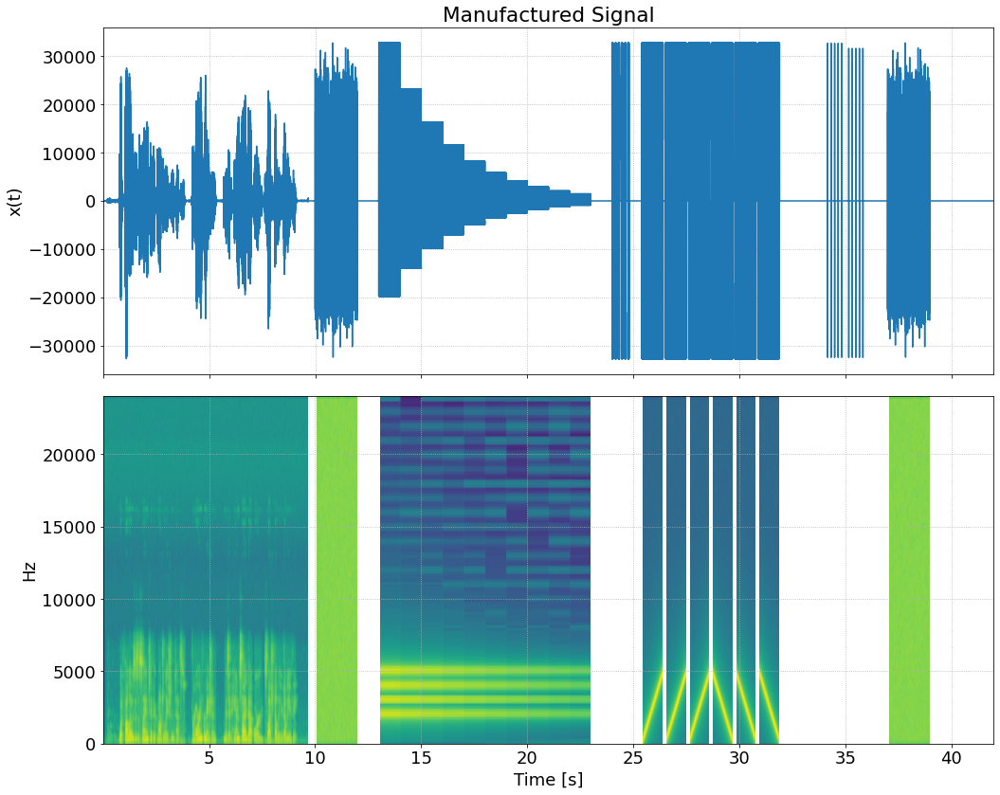

In [204]:
plot_signal(t_wav0, wav0, title="Manufactured Signal")

# Extract white nosie

In [205]:
# Extract the white noise
white_noise, t_white_noise = extract(wav0_n, 10, 12, fs_wav0)

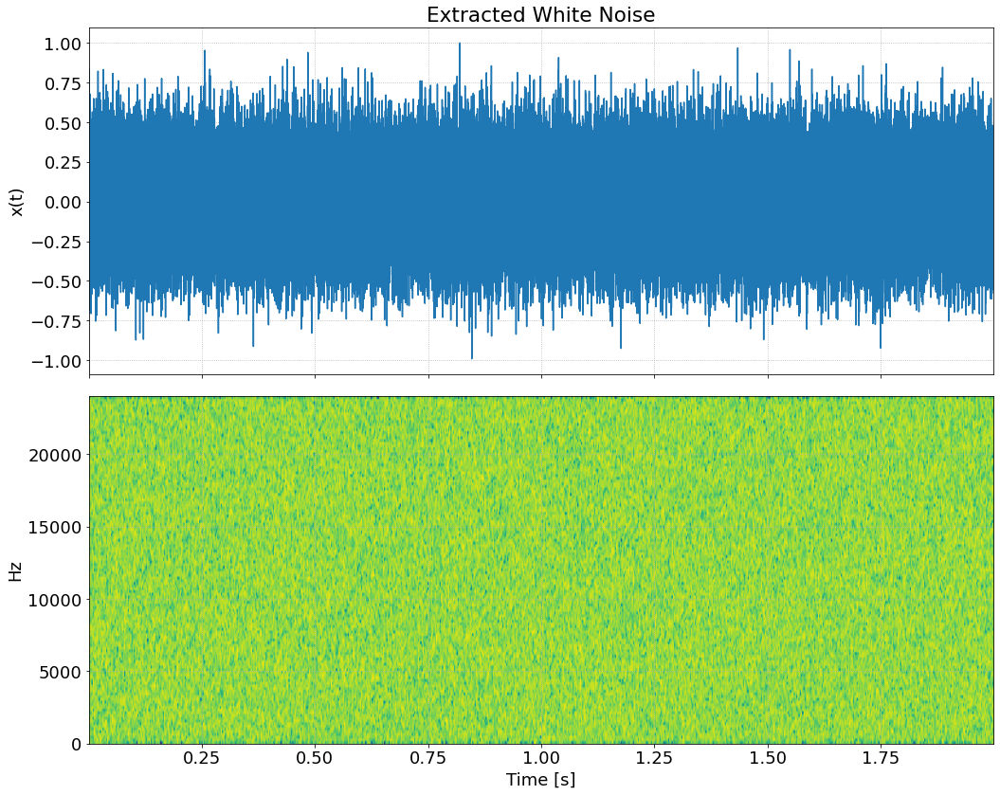

In [206]:
plot_signal(t_white_noise, white_noise, title="Extracted White Noise")

## Uncomment for correlation between the extracted signal and original test signal

In [207]:
# R_test_white = cp.correlate(wav0_n, white_noise)

# t_test_white = np.arange(len(R_test_white))*(1./fs_wav0)

# plot_correlation(t_test_white, R_test_white, title='Full Manufactured Signal vs. Manufactured White Noise')

# Extract Chirps

In [208]:
chirps, t_chirps = extract(wav0_n, 24, 32, fs_wav0)

/home/cuong/anaconda3/envs/wwv-dev/lib/python3.9/site-packages/matplotlib/axes/_axes.py:7626: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


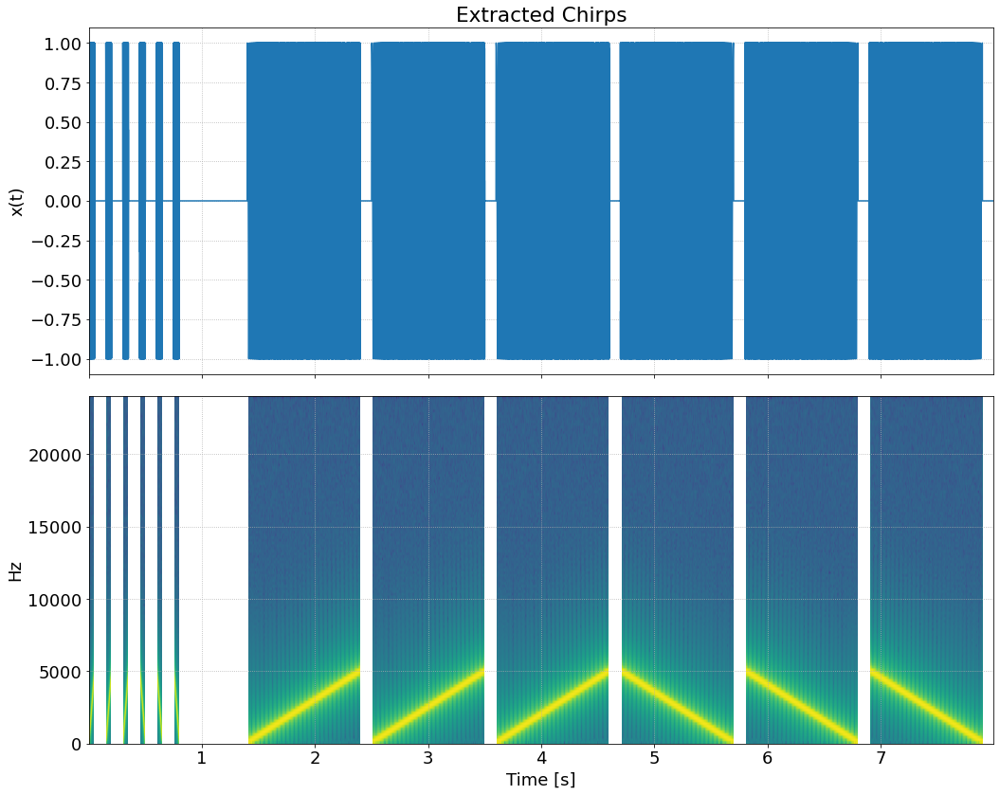

In [209]:
plot_signal(t_chirps, chirps, title="Extracted Chirps")

## Uncomment for correlation between extracted chirps and test

In [210]:
# R_test_white = np.correlate(wav0_n, white_noise)

# t_test_white = np.arange(len(R_test_white))*(1./fs_wav0)

# plot_correlation(t_test_white, R_test_white, title='Full Manufactured Signal vs. Manufactured White Noise')

# Load the IQ Data and Perform AM Demodulation

In [211]:
# Note that IQ WAV files look like regular stereo WAV files, but instead of 
# the channels representing the left and right speakers, they represent the
# I and Q signals.

fs_wav1, iq = wavfile.read(fname1)
t_wav1      = np.arange(len(iq))*(1./fs_wav1)

print('Sample Rate: {!s} samples/sec'.format(fs_wav1))
print('Number of Channels: {!s}'.format(iq.shape[1]))
print('Data Type: {!s}'.format(iq.dtype))

Sample Rate: 20250 samples/sec
Number of Channels: 2
Data Type: int16


In [212]:
iq_float = iq / (np.max(np.abs(iq))+1.0) 

In [213]:
# AM demodulation.
wav1 = np.sqrt(iq_float[:,0]**2 + iq_float[:,1]**2)

In [214]:
play(wav1, fs_wav1)

In [215]:
# Normalize the data
wav1_n = norm(wav1)

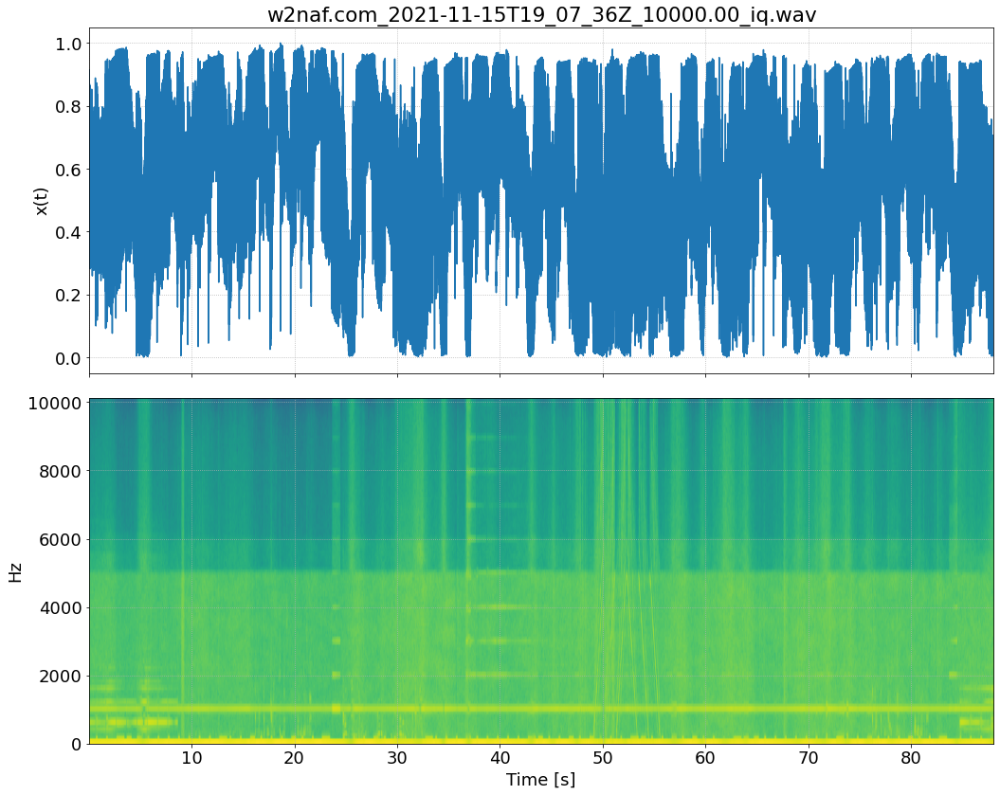

In [216]:
plot_signal(t_wav1, wav1_n, title=fname1)

# Remove the DC Offset

In [217]:
wav1_offset = dco(wav1_n)

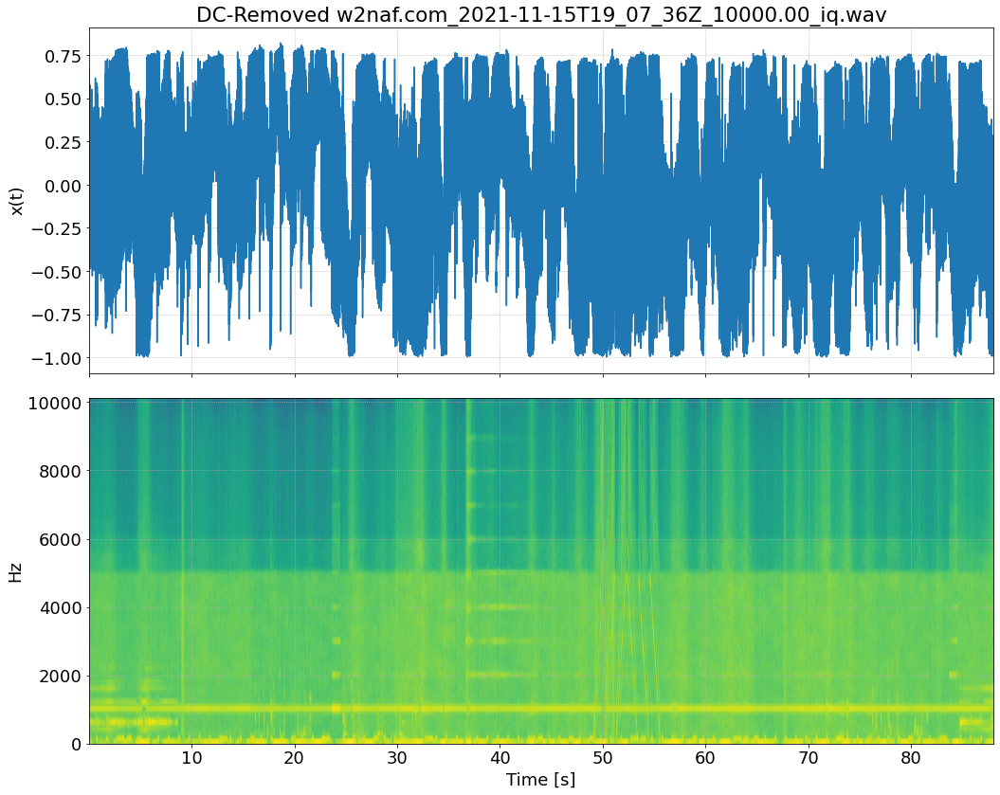

In [218]:
plot_signal(t_wav1, wav1_offset, title='DC-Removed '+fname1)

# Resample Received Signal to match Sampling Rate of Test

## scipy.signal.resample

In [219]:
rewav1, t_rewav1 = signal.resample(wav1_offset, int(len(wav1_offset)/fs_wav1*fs_wav0), t=t_wav1)

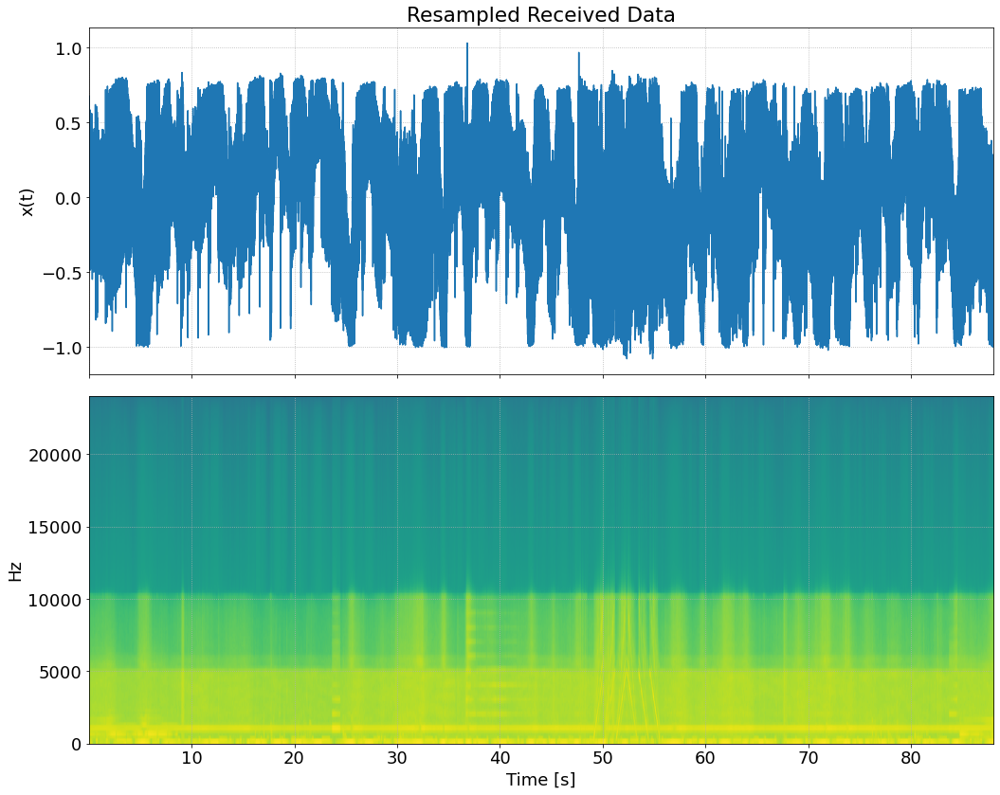

In [220]:
plot_signal(t_rewav1, rewav1, title='Resampled Received Data')

## scipy.signal.resample_poly

In [221]:
# rewav1 = signal.resample_poly(wav1_offset, fs_wav0, fs_wav1)
# t_rewav1 = np.arange(len(rewav1)) * (1./fs_wav0)

In [222]:
# plot_signal(t_rewav1, rewav1, title='Resampled Received Data')

# Timing of the Collected Chirps

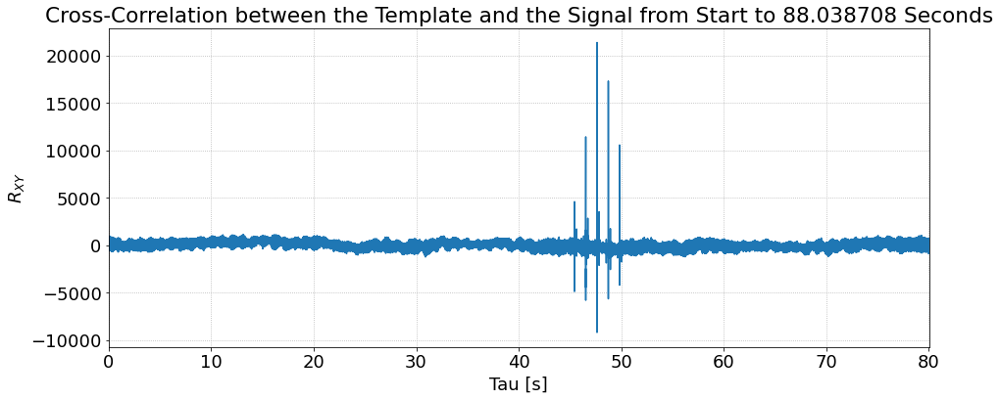

In [223]:
chirps_time = find(chirps, rewav1, fs_wav0)

In [224]:
print('Chirps begin after {!s} seconds'.format(chirps_time))

Chirps begin after 47.637499999999996 seconds


[5.43610417 5.43666667 5.43745833 6.53610417 6.53666667 6.53747917
 6.737375   7.63610417 7.63666667 7.6375     7.63791667 7.63816667
 7.837375   8.73622917 8.7366875  8.7375     8.73816667 9.83622917
 9.8366875  9.83752083 9.83816667]


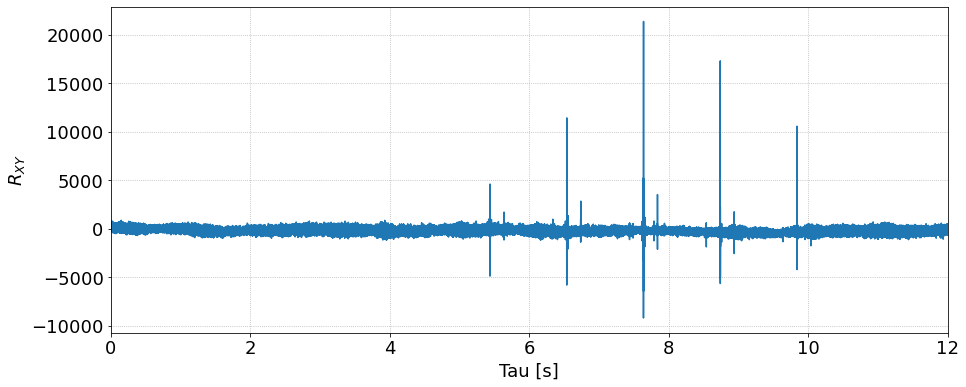

In [233]:
Rxy = cp.correlate(cp.array(extract(rewav1,40,60,fs_wav0)[0]), cp.array(chirps))


peaks, _ = signal.find_peaks(cp.asnumpy(Rxy), prominence=(np.max(cp.asnumpy(Rxy))/4))
print(peaks/fs_wav0)

fig = plt.figure(figsize=(15,6))

ax = fig.add_subplot(1,1,1)
ax.plot(np.arange(len(Rxy))*(1./fs_wav0), cp.asnumpy(Rxy))
ax.set_xlabel('Tau [s]')
ax.set_ylabel('$R_{XY}$')
# ax.set_title(title)

plt.show()
plt.close(fig)

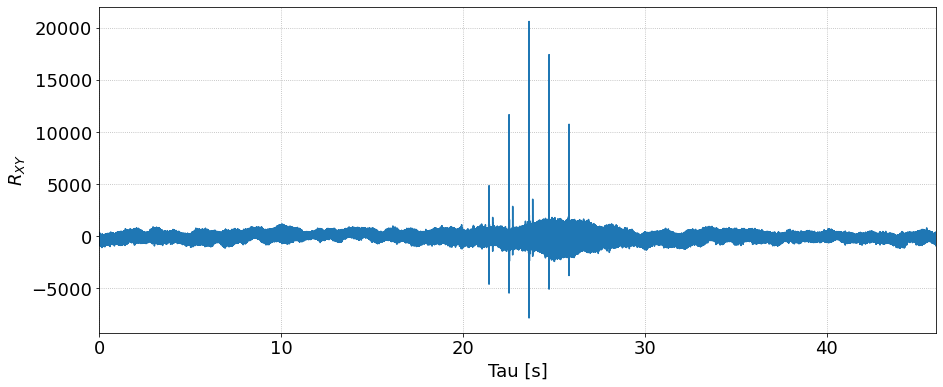

In [226]:
Rxy = cp.correlate(cp.array(rewav1), cp.array(wav0_n))


# peaks, _ = signal.find_peaks(cp.asnumpy(Rxy), prominence=(np.max(cp.asnumpy(Rxy))/4))
# print(peaks/fs_wav0)

fig = plt.figure(figsize=(15,6))

ax = fig.add_subplot(1,1,1)
ax.plot(np.arange(len(Rxy))*(1./fs_wav0), cp.asnumpy(Rxy))
ax.set_xlabel('Tau [s]')
ax.set_ylabel('$R_{XY}$')
# ax.set_title(title)

plt.show()
plt.close(fig)

# Timing of the First White Gaussian Noise

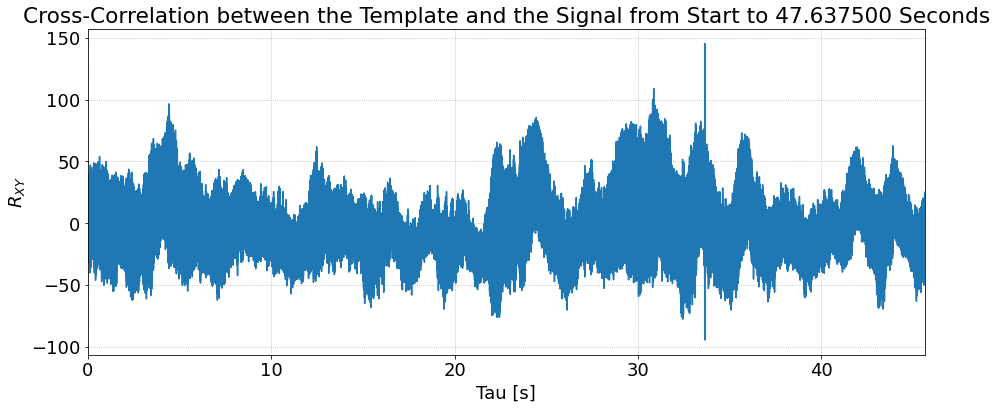

In [227]:
noise1_time = find(white_noise, extract(rewav1, 'start', chirps_time, fs_wav0)[0], fs_wav0)

In [228]:
print('First white noise begins after {!s} seconds'.format(noise1_time))

First white noise begins after 33.63589583333333 seconds


# Timing of the Second White Gaussian Noise

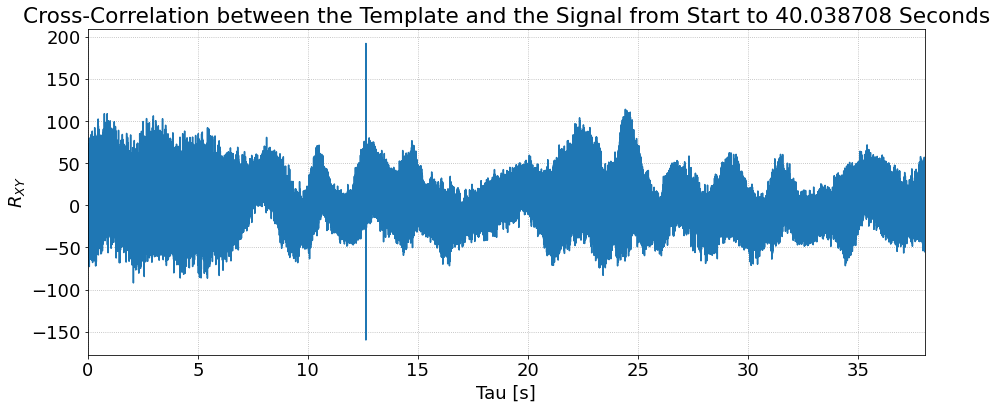

In [229]:
noise2_time = find(white_noise, extract(rewav1, math.ceil(chirps_time), 'end', fs_wav0)[0], fs_wav0) + math.ceil(chirps_time)

In [230]:
print('Second white noise begins after {!s} seconds'.format(noise2_time))

Second white noise begins after 60.638 seconds


In [231]:
xs = np.arange(0, np.pi, 0.05)
data = np.sin(xs)
peakind = signal.find_peaks_cwt(data, np.arange(1,10))
peakind, xs[peakind], data[peakind]

(array([32]), array([1.6]), array([0.9995736]))

In [232]:
len(xs)

63